In [1]:
from astropy.io import fits

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np

import os
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '0.15'

jax.config.update("jax_enable_x64", True)

from regression import log_likelihood_image
from optimize import quick_optimize_full_opt, quick_image_full_opt, quick_optimize_cent, quick_image_cent
from datetime import datetime

## Get the initial system parameters

In [2]:
import pandas

image_data = pandas.read_csv('image_info.csv')
image_data.set_index("Name", inplace=True)
image_data.columns = ["Radius", "Inclination", "Position Angle", "Distance"]
image_data = image_data.loc['hd146897_H_pol']
print(image_data)

Radius             85.0
Inclination        84.0
Position Angle    113.9
Distance          131.5
Name: hd146897_H_pol, dtype: float64


## Reading and Displaying Fits File

In [3]:
def process_image(image, scale_factor=1, offset=1):
    scaled_image = (image[::scale_factor, ::scale_factor])[1::, 1::]
    cropped_image = image[70:210, 70:210]
    def safe_float32_conversion(value):
        try:
            return np.float32(value)
        except (ValueError, TypeError):
            print("This value is unjaxable: " + str(value))
    fin_image = np.nan_to_num(cropped_image)
    fin_image = np.vectorize(safe_float32_conversion)(fin_image)
    return fin_image


def create_empirical_err_map(data, annulus_width=5, mask_rad=9):    
    y,x = np.indices(data.shape)
    y -= data.shape[0]//2
    x -= data.shape[1]//2 
    radii = np.sqrt(x**2 + y**2) 
    noise_array = np.zeros_like(data)
    for i in range(0, int(np.max(radii)//annulus_width) ): 
        indices = (radii > i*annulus_width) & (radii <= (i+1)*annulus_width) 
        noise_array[indices] = np.nanstd(data[indices])
    mask = radii <= mask_rad
    noise_array[mask] = 0
    return noise_array

def get_inc_bounded_knots(inclination, num_knots, buffer = 2):
    
    knot_locations = jnp.linspace(jnp.cos(jnp.deg2rad(90-inclination-buffer)), jnp.cos(jnp.deg2rad(90+inclination+buffer)), num_knots)

    return knot_locations

In [4]:
image_data.name

'hd146897_H_pol'

Filename: Fits/hd146897_H_pol.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     432   ()      
  1  SCI           1 ImageHDU       135   (281, 281, 4)   float32   
  2  DQ            3 ImageHDU        64   (281, 281, 2)   uint8   


/tmp/ipykernel_426976/838794776.py:32: RuntimeWarning: divide by zero encountered in divide
  im = axes[2].imshow(image/noise_map, origin='lower', cmap='inferno')
/tmp/ipykernel_426976/838794776.py:32: RuntimeWarning: invalid value encountered in divide
  im = axes[2].imshow(image/noise_map, origin='lower', cmap='inferno')


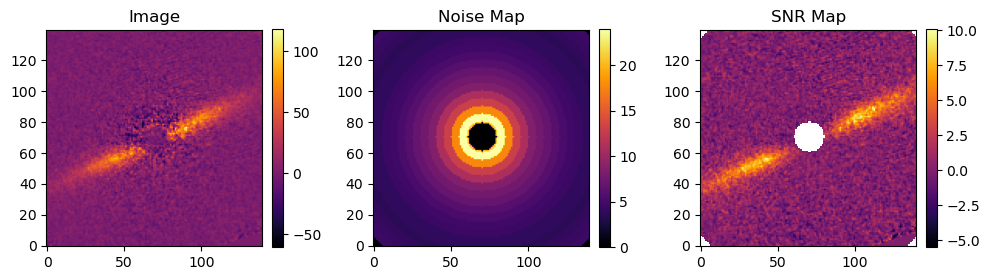

In [5]:
index = 1
name = image_data.name
hdul = fits.open("Fits/"+name+".fits")
#Displays File Info
hdul.info()

# Gets Image
image = process_image(hdul['SCI'].data[1,:,:])

# Noise map 
mask_radius = 9
mask = np.ones_like(image)
y,x = np.indices(image.shape)
y -= image.shape[0]//2
x -= image.shape[1]//2
radii = np.sqrt(x**2 + y**2)
mask[radii <= mask_radius] = 0
noise_map = create_empirical_err_map(process_image(hdul['SCI'].data[2,:,:]))


# Displays Image
fig, axes = plt.subplots(1, 3, figsize=(10, 5))

im = axes[0].imshow(image, origin='lower', cmap='inferno')
axes[0].set_title('Image')
fig.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

im = axes[1].imshow(noise_map, origin='lower', cmap='inferno')
axes[1].set_title('Noise Map')
fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

im = axes[2].imshow(image/noise_map, origin='lower', cmap='inferno')
axes[2].set_title('SNR Map')
fig.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

plt.tight_layout()


## Define some functions and do a first fit

In [6]:
from disk_utils_jax import jax_model_all_1d, jax_model
from regression import log_likelihood_1d_pos_all_pars_spline
from scipy.optimize import minimize
from SLD_utils import *

In [7]:
def get_initial_guess_params(inclination,radius, position_angle, mask, distance, num_knots = 6, knot_scale = None, 
                             target_image = None, full=True, psf_model=EMP_PSF): 

    ##############################################################
    #### Generate a first image to help get the scaling right ####
    ##############################################################

    #Hack in this starting guess for SPF. Force the radius to make it 6 knots. 
    knots = get_inc_bounded_knots(inclination, num_knots, buffer = 0)
    #This is based off an older disk fit - Does alright! 
    # init_knot_guess = jnp.array([2.75100528e-04, 2.62405787e-04,2.50897081e-04, 2.40426582e-04,  2.30863915e-04, 2.22149277e-04])
    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots)/ 1e4
    
    #alpha_in, alpha_out, 
    init_disk_guess = jnp.array([23., -13., radius, inclination, position_angle])
    init_cent_guess = jnp.array([68., 68.])
    init_guess = None

    if(full):
        image_fun = quick_image_full_opt
        #amin, ksi0, gamma, beta
        distr_guess = jnp.array([0, 3, 2, 1])
        init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])
    else:
        image_fun = quick_image_cent
        init_guess = jnp.concatenate([init_cent_guess, init_disk_guess, init_knot_guess])

    ###########################
    ##### Scale the knots #####
    ###########################
    if knot_scale is None:
        if target_image is None: 
            raise ValueError("If you don't provide a knot scale, you need to provide a target image to scale to.")
        init_image = image_fun(init_guess, PSFModel = psf_model, pxInArcsec=0.01414, distance = distance, knots=knots)
        if inclination > 70: 
            knot_scale = 1.*np.percentile(target_image[mask], 99) / jnp.nanmax(init_image)
        else: 
            knot_scale = 0.2*np.percentile(target_image[mask], 99) / jnp.nanmax(init_image)

    init_knot_guess = init_knot_guess * knot_scale
    if(full):
        init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])
    else:
        init_guess = jnp.concatenate([init_cent_guess, init_disk_guess, init_knot_guess])

    return init_guess

In [8]:
def plot_data_model_residuals(target_image, distance, params, knots = None, full = True,mask = None): 

    #Get the initial guess image
    if full: 
        image_fun = quick_image_full_opt
    else: 
        image_fun = quick_image_cent

    if mask is None: 
        mask = np.ones_like(target_image)

    init_image = image_fun(params, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots = knots)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    im = axes[0].imshow(target_image*mask, origin='lower', cmap='inferno')
    axes[0].set_title('Target Image')
    plt.colorbar(im, ax=axes[0], fraction=0.046, pad=0.04)

    im = axes[1].imshow(init_image*mask, origin='lower', cmap='inferno')
    axes[1].set_title('Model Image')
    plt.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)

    im = axes[2].imshow((target_image-init_image)*mask, origin='lower', cmap='inferno')
    axes[2].set_title('Residuals')
    plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

    plt.show()

[ 23.         -13.          85.          91.         113.9
  68.          68.           0.           3.           2.
   1.         238.51442004  84.37573861  45.937078    29.83984753
  21.3528763   16.24430188  12.8911802   10.55148578   8.84283914]


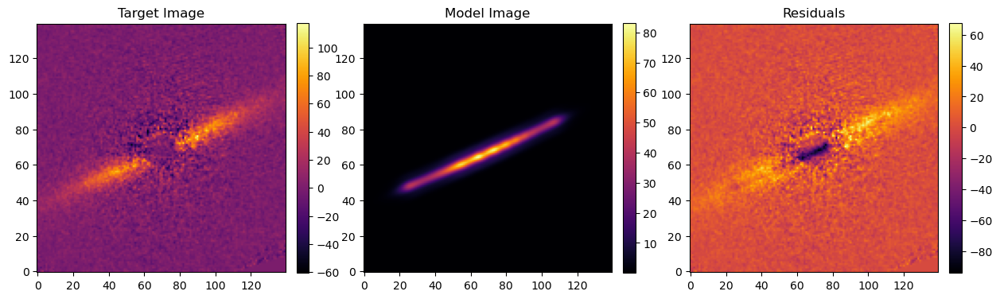

In [9]:
num_knots = 9
# inclination,radius, position_angle, mask, distance, knot_scale = None, target_image = None, full=True): 
knots = get_inc_bounded_knots(image_data['Inclination'], num_knots, buffer = 0)

init_guess = get_initial_guess_params(image_data['Inclination']+7, 
                                      image_data['Radius'], 
                                      image_data['Position Angle'], 
                                     mask.astype(bool), 
                                     image_data['Distance'], num_knots = num_knots,
                                     target_image = image, full=True, 
                                     knot_scale=0.5e7)
print(init_guess)

plot_data_model_residuals(image, image_data['Distance'], init_guess, full = True, knots =knots)

## Do a fit now

In [10]:
##########################
##### Do the fit #####
##########################
full = True
if(full):
    opt_fun = quick_optimize_full_opt
    image_fun = quick_image_full_opt
else:
    opt_fun = quick_optimize_cent
    image_fun = quick_image_cent

knots = get_inc_bounded_knots(image_data['Inclination'], num_knots, buffer = 0  )

print("Starting optimization")
start = datetime.now()
soln = opt_fun(image, noise_map, init_guess=init_guess, method = 'Nelder-Mead', 
               iters = 10000, PSFModel=EMP_PSF, pxInArcsec=0.01414, 
               distance = image_data['Distance'], 
               knots = knots, full_soln=True, disp=False)
end = datetime.now()
print("Time taken: " + str(end-start))

print(soln.message)
cent_image = image_fun(soln.x, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = image_data['Distance'], knots=knots)

Starting optimization


Time taken: 0:00:23.083485
Optimization terminated successfully.


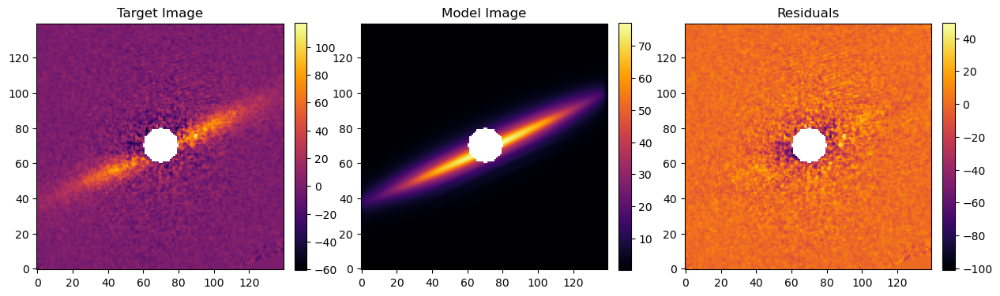

In [11]:
# Noise map 
mask_radius = 9
mask = np.ones_like(image)
y,x = np.indices(image.shape)
y -= image.shape[0]//2
x -= image.shape[1]//2
radii = np.sqrt(x**2 + y**2)
mask[radii <= mask_radius] = np.nan

plot_data_model_residuals(image, image_data['Distance'], soln.x, full = full, knots=knots, 
                          mask = mask)

### Go back to other optimization method and see if it improves things: 

In [12]:
print("Starting optimization")
start = datetime.now()
soln_2 = opt_fun(image, noise_map, init_guess=jnp.array(soln.x),  
               iters = 10000, PSFModel=EMP_PSF, pxInArcsec=0.01414, 
               distance = image_data['Distance'], 
               knots = knots, full_soln=True, disp=False)

end = datetime.now()
print("Time taken: " + str(end-start))

print(soln.message)

Starting optimization


Time taken: 0:00:06.561753
Optimization terminated successfully.


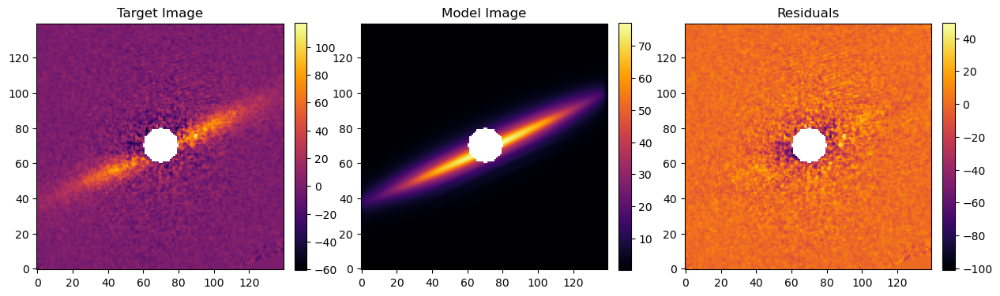

In [13]:
plot_data_model_residuals(image, image_data['Distance'], soln_2.x, full = full,knots=knots,
                          mask = mask)

In [14]:
np.save("./FitsResults/"+name+"_soln.npy", soln_2.x)

# Plot the spline

knots.shape

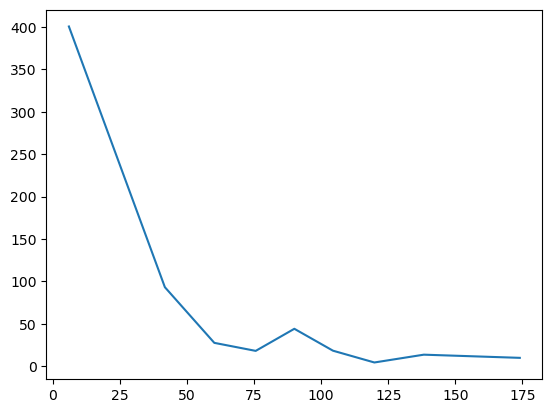

In [15]:
knots_degrees = np.degrees(np.arccos(knots))
knot_values = soln_2.x[-num_knots:]
plt.plot(knots_degrees, knot_values)

In [16]:
from regression import log_likelihood_1d_pos_cent, log_likelihood_1d_full_opt

llp = lambda x: -log_likelihood_1d_full_opt(x, 
                    DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                    1e6, image, noise_map, PSFModel = EMP_PSF, pxInArcsec=0.01414, 
                    distance = image_data["Distance"],
                    knots=knots)

DISK_BOUNDS = np.array([np.array([1, -10, 0, 0, 0]), np.array([1000, -1, 1500, 180, 400])])
CENT_BOUNDS = np.array([np.array([65, 65]), np.array([75, 75])])
SPLINE_BOUNDS = np.array([np.zeros(jnp.size(knots)), 1000*np.ones(jnp.size(knots))])
DISTR_BOUNDS = np.array([np.array([0,0,0,0]), np.array([1000, 10, 10, 10])])
BOUNDS = np.array([np.concatenate([DISK_BOUNDS[0], CENT_BOUNDS[0], DISTR_BOUNDS[0],SPLINE_BOUNDS[0]]),
                    np.concatenate([DISK_BOUNDS[1], CENT_BOUNDS[1], DISTR_BOUNDS[1],SPLINE_BOUNDS[1]])])


 

In [21]:
p0 = soln_2.x
p0[7] = 1e-5

nwalkers = 128
niter = 1000
burns = 200

from mcmc_model import MCMC_model
mc_model = MCMC_model(llp, BOUNDS)
mc_model.run(p0, frac_ball_size=0.01,nwalkers=nwalkers, niter=niter, burn_iter=burns)

Running burn-in...
Running production...


(<emcee.ensemble.EnsembleSampler at 0x7f1dc851d400>,
 array([[ 77.94687197,  -7.39864687, 195.73630098, ...,   1.0608443 ,
          10.49286682,  27.6700616 ],
        [ 30.69105113,  -8.46851212, 343.477442  , ...,   4.47039424,
          19.1568372 ,  13.06233933],
        [ 25.36100528,  -5.64247546, 359.72890999, ...,   2.2075658 ,
          17.68755031,  12.56697914],
        ...,
        [ 85.37839497,  -5.23312333, 271.73884555, ...,   5.58068301,
           4.79144343,  11.31748601],
        [ 21.31373198,  -9.6643568 , 229.75086379, ...,   5.37410251,
          15.1565103 ,   9.66201563],
        [ 41.08137023,  -8.00041095, 194.23482981, ...,   6.52885901,
           8.22788433,   5.01298179]]),
 array([-3.05969449, -3.05969449, -3.05969449, -3.05969449, -3.05969449,
        -3.05969449, -3.05969449, -3.05969449, -2.9774008 , -3.05969449,
        -3.05969449, -3.05969449, -3.05969449, -3.05969449, -3.05969449,
        -3.08310082, -3.05969449, -3.05969449, -3.05969449, -3.05

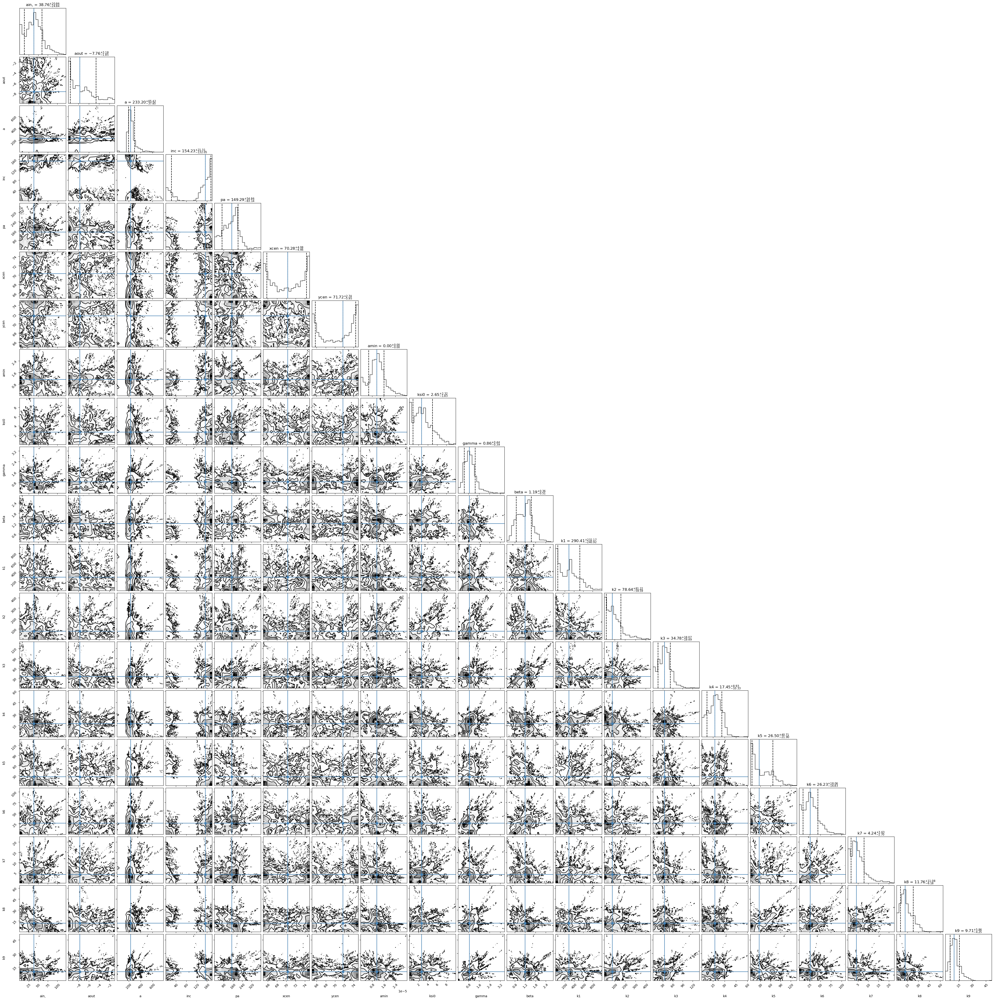

In [32]:
labels = ['ain,', 'aout', 'a', 'inc', 'pa', 'xcen', 'ycen', ]
labels = labels + ['amin', 'ksi0', 'gamma', 'beta']
for i in range(0, jnp.size(knots)):
    labels.append('k'+str(i+1))
#mc_model.show_corner_plot(labels, truths=soln)
mc_model.show_corner_plot(labels, truths=np.median(mc_model.sampler.flatchain, axis=0), quiet = True)

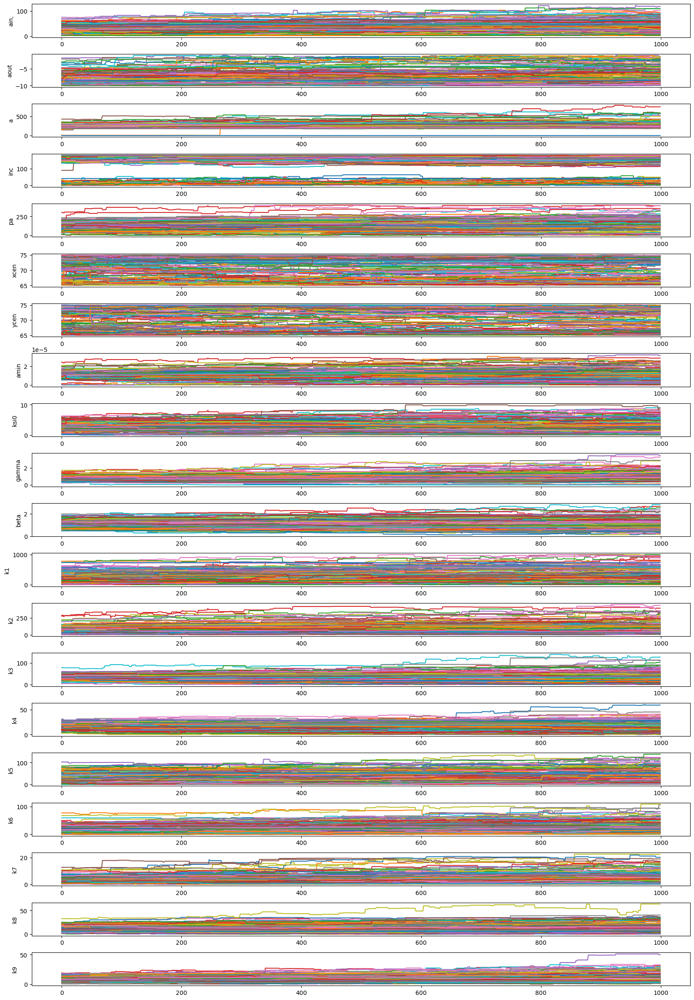

In [34]:
n_cols = int((len(soln_2.x) + 2) / 3)

n_param = soln_2.x.size

fig, axes = plt.subplots(n_param,1, figsize=(20,30))
axes = axes.flatten()
fig.subplots_adjust(hspace=0.5)

for i in range(n_param):
    axes[i].plot(mc_model.sampler.get_chain()[:, :, i])
    axes[i].set_ylabel(labels[i])

# for i in range(0, n_cols):
#     for j in range(0, 3):
#         if(3*i+j < len(soln)):
#             axes[i][j].plot(np.linspace(0, nwalkers, niter), mc_model.sampler.get_chain()[:, :, 3*i+j].T)
#             # axes[i][j].set_ylim(BOUNDS[0][3*i+j], BOUNDS[1][3*i+j])
#             axes[i][j].set_title(labels[3*i+j])

In [24]:
chain = mc_model.sampler.get_chain()

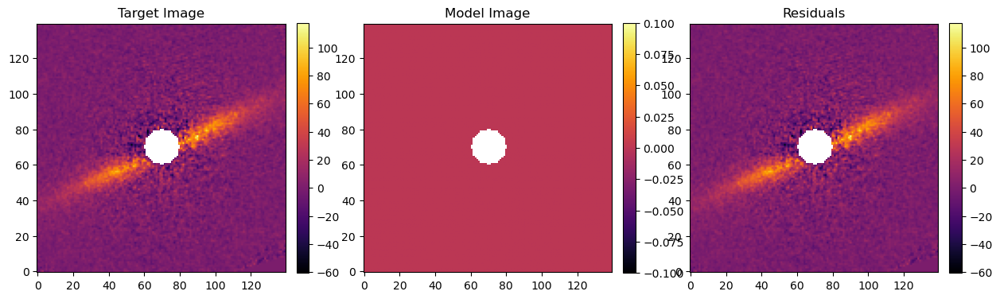

In [29]:
params = np.median(chain[::20,:],axis=(0,1))
plot_data_model_residuals(image, image_data['Distance'], params, full = full,knots=knots,
                          mask = mask)

In [30]:
params

array([ 3.88361270e+01, -7.76109887e+00,  2.32738896e+02,  1.54409798e+02,
        1.49526787e+02,  7.03079516e+01,  7.17331147e+01,  1.12488188e-05,
        2.65010822e+00,  8.55518012e-01,  1.19245751e+00,  2.90401404e+02,
        7.86701851e+01,  3.47207148e+01,  1.74513908e+01,  2.64205840e+01,
        2.61957145e+01,  4.23657557e+00,  1.17399130e+01,  9.70465281e+00])

In [31]:
soln_2.x

array([ 3.32705351e+01, -7.89795898e+00,  1.53217231e+02,  9.17639477e+01,
        1.14584444e+02,  7.22646571e+01,  7.25689109e+01,  1.00000000e-05,
        3.42558600e+00,  6.49611614e-01,  9.26557936e-01,  4.00505747e+02,
        9.30804448e+01,  2.74621961e+01,  1.79970773e+01,  4.40469974e+01,
        1.82121932e+01,  4.32173748e+00,  1.35223596e+01,  9.78028101e+00])

In [ ]:
BOUNDS[0]

array([ 65.,  65.,   1., -10.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
         0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.])